In [ ]:
from google.colab import files
data = files.upload()
 

In [ ]:
import numpy as np
import pandas as pd
import io
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
import matplotlib.pyplot as plt
df = pd.read_csv(io.BytesIO(data['Time_series_analysis_and_forecast_DATASET.csv']))
print(df)
df.head()

       Tmax     SysLoad  GasPrice  ElecPrice         FullDate
0      15.8  1688.21500    3.6900     23.710    9/1/2010 0:00
1      15.8  1669.19500    3.6900     22.635    9/1/2010 1:00
2      15.8  1491.98000    3.6900     22.565    9/1/2010 2:00
3      15.8  1330.76000    3.6900     18.910    9/1/2010 3:00
4      15.8  1247.94000    3.6900     18.030    9/1/2010 4:00
...     ...         ...       ...        ...              ...
92011  24.3   449.63625    5.4848    117.925  2/28/2021 19:00
92012  24.3   815.59975    5.4848     87.880  2/28/2021 20:00
92013  24.3   745.12325    5.4848     62.060  2/28/2021 21:00
92014  24.3   694.95150    5.4848     62.000  2/28/2021 22:00
92015  24.3   714.69630    5.4848     62.955  2/28/2021 23:00

[92016 rows x 5 columns]


,Tmax,SysLoad,GasPrice,ElecPrice,FullDate
0,15.8,1688.215,3.69,23.710,9/1/2010 0:00
1,15.8,1669.195,3.69,22.635,9/1/2010 1:00
2,15.8,1491.980,3.69,22.565,9/1/2010 2:00
3,15.8,1330.760,3.69,18.910,9/1/2010 3:00
4,15.8,1247.940,3.69,18.030,9/1/2010 4:00


Text(0, 0.5, 'ElecPrice')

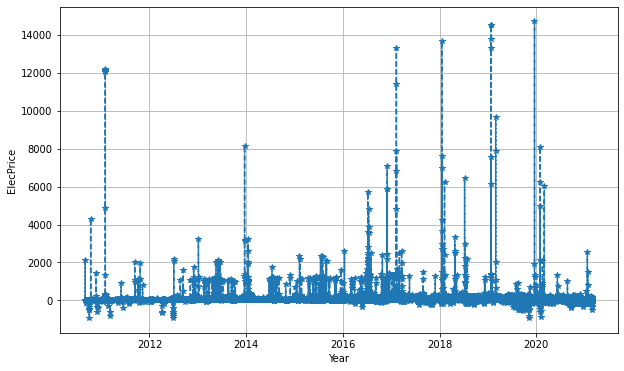

In [ ]:
df[ "FullDate" ] = pd.to_datetime(df[ "FullDate" ]) #convert column to datetime 
df.set_index( "FullDate" , inplace= True, drop=False ) 
plt.figure(figsize=( 10 , 6 )) 
plt.plot(df.index, df.ElecPrice, '--' , marker= '*' , ) 
plt.grid() 
plt.xlabel( 'Year' ) 
plt.ylabel( 'ElecPrice' ) 

In [ ]:
#check for missing values 
df.isnull().values.any() 

False

In [ ]:
df_resam = df.resample( 'M' ).mean()
from statsmodels.tsa.stattools import adfuller
adf_result = adfuller(df['GasPrice', 'SysLoad'])
print(f'ADF Statistic: {adf_result[0]}')
print(f'p-value: {adf_result[1]}')
print(f'No. of lags used: {adf_result[2]}')
print(f'No. of observations used : {adf_result[3]}')
print('Critical Values:')
for k, v in adf_result[4].items():
    print(f'   {k}: {v}') 

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


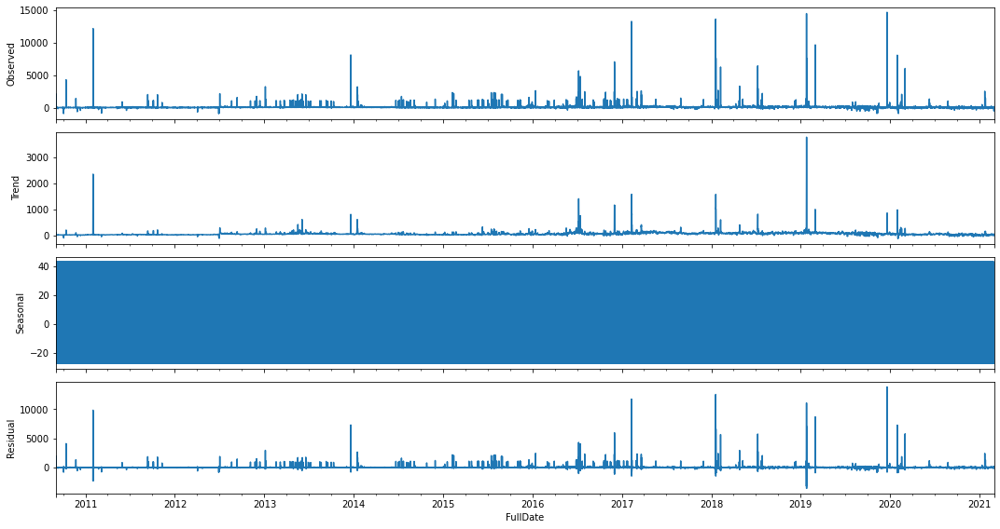

In [ ]:
import statsmodels.api as sm
from pylab import rcParams
rcParams['figure.figsize'] = 15, 8
decompose_series = sm.tsa.seasonal_decompose(df['ElecPrice'], model='additive')
decompose_series.plot()
plt.show()

In [ ]:
df.columns

Index(['Tmax', 'SysLoad', 'GasPrice', 'ElecPrice', 'FullDate'], dtype='object')

In [ ]:
#Univariate time series model
df = df.rename(columns={"FullDate": "ds", "ElecPrice": "y"})
df_dropped = df.drop(columns=['Tmax', 'SysLoad', 'GasPrice'])
df_dropped.head()

,y,ds
FullDate,,
2010-09-01 00:00:00,23.710,2010-09-01 00:00:00
2010-09-01 01:00:00,22.635,2010-09-01 01:00:00
2010-09-01 02:00:00,22.565,2010-09-01 02:00:00
2010-09-01 03:00:00,18.910,2010-09-01 03:00:00
2010-09-01 04:00:00,18.030,2010-09-01 04:00:00


In [ ]:
train = df_dropped.iloc[:len(df_dropped)-2757]
test = df_dropped.iloc[len(df_dropped)-2757:]
model = Prophet()
model.fit(train)

In [ ]:
future = model.make_future_dataframe(periods=365, freq='M')
forecast = model.predict(future)
forecast.head()
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'trend', 'trend_lower', 'trend_upper']]

,ds,yhat,yhat_lower,yhat_upper,trend,trend_lower,trend_upper
0,2010-09-01 00:00:00,24.464923,-256.271891,293.220229,37.201104,37.201104,37.201104
1,2010-09-01 01:00:00,21.483319,-237.742254,287.449357,37.200091,37.200091,37.200091
2,2010-09-01 02:00:00,11.983258,-275.089009,275.640613,37.199077,37.199077,37.199077
3,2010-09-01 03:00:00,1.922298,-262.736279,283.421230,37.198063,37.198063,37.198063
4,2010-09-01 04:00:00,-0.851916,-297.800102,259.765246,37.197050,37.197050,37.197050
...,...,...,...,...,...,...,...
89619,2050-11-30 02:00:00,-1457.294863,-39401.873700,29943.886615,-1436.569685,-39466.966077,29948.448919
89620,2050-12-31 02:00:00,-1475.228089,-39606.507986,30010.429631,-1440.701273,-39633.258623,30080.913118
89621,2051-01-31 02:00:00,-1409.535985,-39767.740877,30089.005066,-1444.832861,-39767.629165,30216.319399
89622,2051-02-28 02:00:00,-1462.449423,-39788.332673,30442.974725,-1448.564618,-39882.838773,30363.416873


In [ ]:
plot_components_plotly(model, forecast)



In [ ]:
from statsmodels.tools.eval_measures import rmse
predictions = forecast.iloc[-2757:]['yhat']

In [ ]:
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())
mape = mean_absolute_error(train['y'], test['y'])*100
mape

Root Mean Squared Error between actual and  predicted values:  326.1603593021492
Mean Value of Test Dataset: 25.637575262966976


In [ ]:
#Multivariate time series model
df = df.rename(columns={"Tmax": "add1", "SysLoad": "add2", "GasPrice": "add3"})
df

,add1,add2,add3,y,ds
FullDate,,,,,
2010-09-01 00:00:00,15.8,1688.21500,3.6900,23.710,2010-09-01 00:00:00
2010-09-01 01:00:00,15.8,1669.19500,3.6900,22.635,2010-09-01 01:00:00
2010-09-01 02:00:00,15.8,1491.98000,3.6900,22.565,2010-09-01 02:00:00
2010-09-01 03:00:00,15.8,1330.76000,3.6900,18.910,2010-09-01 03:00:00
2010-09-01 04:00:00,15.8,1247.94000,3.6900,18.030,2010-09-01 04:00:00
...,...,...,...,...,...
2021-02-28 19:00:00,24.3,449.63625,5.4848,117.925,2021-02-28 19:00:00
2021-02-28 20:00:00,24.3,815.59975,5.4848,87.880,2021-02-28 20:00:00
2021-02-28 21:00:00,24.3,745.12325,5.4848,62.060,2021-02-28 21:00:00


In [ ]:
train = df.iloc[:len(df)-2757]
test = df.iloc[len(df)-2757:]
test

,add1,add2,add3,y,ds
FullDate,,,,,
2020-11-06 03:00:00,18.2,676.84685,5.8000,55.320,2020-11-06 03:00:00
2020-11-06 04:00:00,18.2,692.20005,5.8000,62.580,2020-11-06 04:00:00
2020-11-06 05:00:00,18.2,673.36585,5.8000,67.685,2020-11-06 05:00:00
2020-11-06 06:00:00,18.2,807.80015,5.8000,95.965,2020-11-06 06:00:00
2020-11-06 07:00:00,18.2,907.90820,5.8000,72.345,2020-11-06 07:00:00
...,...,...,...,...,...
2021-02-28 19:00:00,24.3,449.63625,5.4848,117.925,2021-02-28 19:00:00
2021-02-28 20:00:00,24.3,815.59975,5.4848,87.880,2021-02-28 20:00:00
2021-02-28 21:00:00,24.3,745.12325,5.4848,62.060,2021-02-28 21:00:00


In [ ]:
model2 = Prophet()
model2.add_regressor('add1')
model2.add_regressor('add2')
model2.add_regressor('add3')
model2.fit(train)

In [ ]:
forecast = model2.predict(test.drop(columns="y"))
forecast.head()
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'trend', 'trend_lower', 'trend_upper']]

,ds,yhat,yhat_lower,yhat_upper,trend,trend_lower,trend_upper
0,2020-11-06 03:00:00,62.005637,-223.222557,324.698554,81.748378,81.748378,81.748378
1,2020-11-06 04:00:00,65.767170,-209.440073,306.505286,81.748798,81.748798,81.748798
2,2020-11-06 05:00:00,71.366847,-183.928883,333.261530,81.749219,81.749219,81.749219
3,2020-11-06 06:00:00,87.226978,-193.590982,357.353242,81.749639,81.749639,81.749639
4,2020-11-06 07:00:00,96.503318,-168.902082,359.112240,81.750060,81.750060,81.750060
...,...,...,...,...,...,...,...
2752,2021-02-28 19:00:00,44.321535,-222.494032,329.932568,82.905247,80.818064,85.193563
2753,2021-02-28 20:00:00,54.103572,-210.046568,319.714936,82.905667,80.818015,85.195930
2754,2021-02-28 21:00:00,39.414425,-228.119864,297.193216,82.906088,80.817966,85.198297
2755,2021-02-28 22:00:00,35.548784,-226.247807,294.070621,82.906508,80.817917,85.200663


In [ ]:
plot_components_plotly(model2, forecast)

In [ ]:
#Accuracy of the model
from statsmodels.tools.eval_measures import rmse
predictions = forecast.iloc[-2757:]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())
mape = mean_absolute_error(train['y'], test['y'])*100
mape

Root Mean Squared Error between actual and  predicted values:  69.19293208528558
Mean Value of Test Dataset: 25.637575262966976


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
df_pre=pd.DataFrame({'actual': test.y.values, 'predicted': forecast.yhat.values.astype(int)})
df_pre.reset_index(drop=True, inplace=True)
df_pre

,actual,predicted
0,55.320,62
1,62.580,65
2,67.685,71
3,95.965,87
4,72.345,96
...,...,...
2752,117.925,44
2753,87.880,54
2754,62.060,39
2755,62.000,35


In [ ]:
#Multivariate time series model without Tmax
df = df.rename(columns={"SysLoad": "add1", "GasPrice": "add2"})
df_droppedTmax = df.drop(columns=['Tmax'])
df_droppedTmax.head()

In [ ]:
train = df.iloc[:len(df)-2757]
test = df.iloc[len(df)-2757:]
test

In [ ]:
model3 = Prophet()
model3.add_regressor('add1')
model3.add_regressor('add2')
model3.add_regressor('add3')
model3.fit(train)

In [ ]:
forecast = model3.predict(test.drop(columns="y"))
forecast.head()
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'trend', 'trend_lower', 'trend_upper']]

In [ ]:
#Accuracy of the model
from statsmodels.tools.eval_measures import rmse
predictions = forecast.iloc[-2757:]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())
mape = mean_absolute_error(train['y'], test['y'])*100
mape